<a href="https://colab.research.google.com/github/SainiPratiksha/Image-Classification-Model/blob/main/Image_Classification_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
!kaggle datasets download -d pythonafroz/solar-panel-images
!unzip solar-panel-images.zip -d /content/solar-panel-images

Dataset URL: https://www.kaggle.com/datasets/pythonafroz/solar-panel-images
License(s): unknown
100% 304M/305M [00:05<00:00, 83.8MB/s]
100% 305M/305M [00:05<00:00, 61.4MB/s]
Archive:  solar-panel-images.zip
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (1).jpeg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (10).jpg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (100).jpg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (101).jpg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (102).jpg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (103).jpg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (104).jpg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (105).jpg  
  inflating: /content/solar-panel-images/Faulty_solar_panel/Bird-drop/Bird (106).jpg  
  inflating:

In [ ]:
# Check the contents of the dataset
!ls /content/solar-panel-images

Faulty_solar_panel


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
import random
from cv2 import resize
from glob import glob

import warnings
warnings.filterwarnings("ignore")

In [ ]:
img_height = 244
img_width = 244
train_ds = tf.keras.utils.image_dataset_from_directory(
  'solar-panel-images/Faulty_solar_panel',
  validation_split=0.2,
  subset='training',
  image_size=(img_height, img_width),
  batch_size=32,
  seed=42,
  shuffle=True)

val_ds = tf.keras.utils.image_dataset_from_directory(
  'solar-panel-images/Faulty_solar_panel',
  validation_split=0.2,
  subset='validation',
  image_size=(img_height, img_width),
  batch_size=32,
  seed=42,
  shuffle=False)

Found 885 files belonging to 6 classes.
Using 708 files for training.
Found 885 files belonging to 6 classes.
Using 177 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)
train_ds

['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

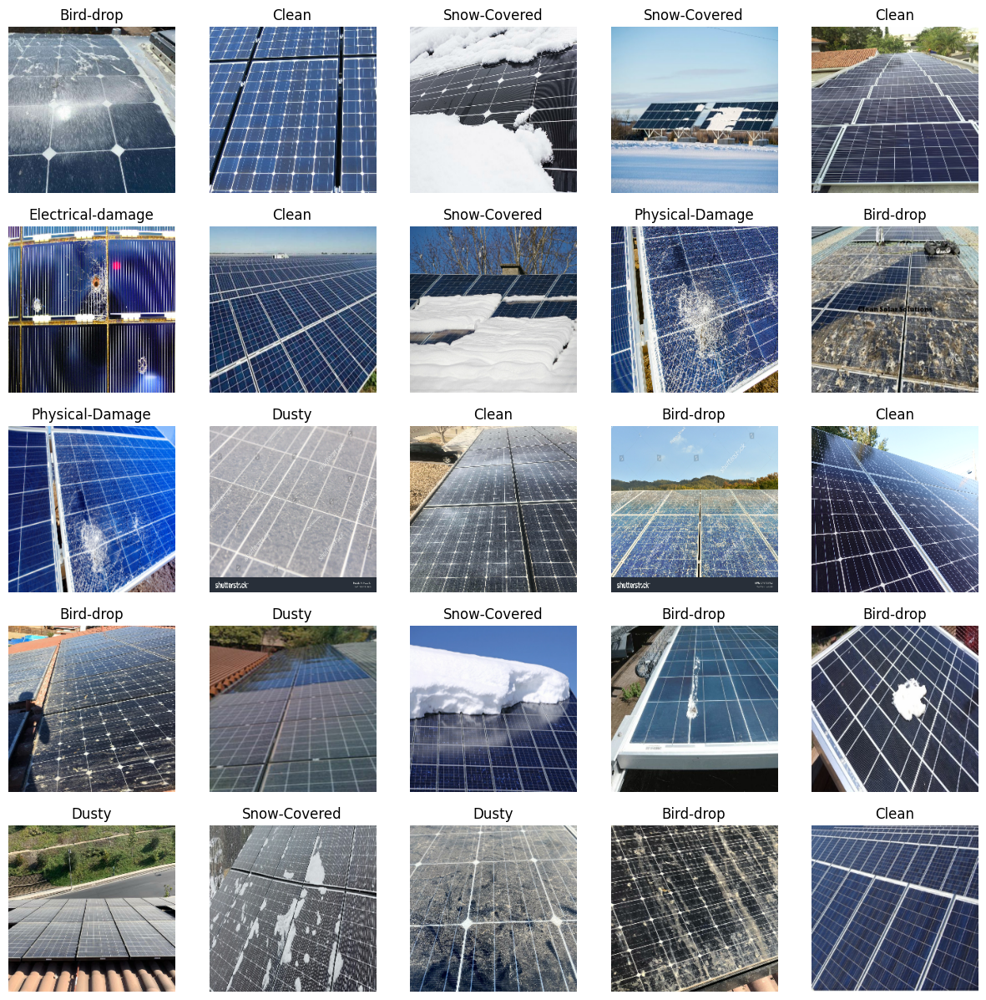

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
base_model = tf.keras.applications.VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(img_height, img_width, 3)
)
base_model.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
inputs = tf.keras.Input(shape=(img_height, img_width, 3))
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs = tf.keras.layers.Dense(90)(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 tf.__operators__.getitem (  (None, 244, 244, 3)       0         
 SlicingOpLambda)                                                
                                                                 
 tf.nn.bias_add (TFOpLambda  (None, 244, 244, 3)       0         
 )                                                               
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                             

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
epoch = 15
model.fit(train_ds, validation_data=val_ds, epochs=epoch,
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            min_delta=1e-2,
            patience=3,
            verbose=1,
            restore_best_weights=True
        )
    ]
)

Epoch 1/15
23/23 [==============================] - 571s 25s/step - loss: 7.9374 - accuracy: 0.1116 - val_loss: 4.4022 - val_accuracy: 0.2090
Epoch 2/15
23/23 [==============================] - 578s 25s/step - loss: 3.9707 - accuracy: 0.3136 - val_loss: 1.6195 - val_accuracy: 0.5537
Epoch 3/15
23/23 [==============================] - 576s 25s/step - loss: 3.0354 - accuracy: 0.4407 - val_loss: 1.5149 - val_accuracy: 0.6328
Epoch 4/15
23/23 [==============================] - 588s 26s/step - loss: 2.3773 - accuracy: 0.4873 - val_loss: 0.8289 - val_accuracy: 0.7966
Epoch 5/15
23/23 [==============================] - 581s 25s/step - loss: 2.1023 - accuracy: 0.5607 - val_loss: 0.9376 - val_accuracy: 0.7458
Epoch 6/15
23/23 [==============================] - 599s 26s/step - loss: 1.7942 - accuracy: 0.5918 - val_loss: 0.8798 - val_accuracy: 0.7740
Epoch 7/15
23/23 [==============================] - 572s 25s/step - loss: 1.4025 - accuracy: 0.6412 - val_loss: 0.5795 - val_accuracy: 0.8362
Epoch 

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
epoch = 5
history = model.fit(train_ds, validation_data=val_ds, epochs=epoch,
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            min_delta=1e-2,
            patience=3,
            verbose=1,
        )
    ]
)

Epoch 1/5
23/23 [==============================] - 642s 28s/step - loss: 10.5247 - accuracy: 0.1017 - val_loss: 4.0631 - val_accuracy: 0.3390
Epoch 2/5
23/23 [==============================] - 638s 28s/step - loss: 5.0371 - accuracy: 0.2585 - val_loss: 2.5868 - val_accuracy: 0.4520
Epoch 3/5
23/23 [==============================] - 652s 28s/step - loss: 3.8159 - accuracy: 0.3376 - val_loss: 1.7622 - val_accuracy: 0.5141
Epoch 4/5
23/23 [==============================] - 649s 28s/step - loss: 2.6376 - accuracy: 0.4576 - val_loss: 1.3801 - val_accuracy: 0.5706
Epoch 5/5
23/23 [==============================] - 634s 28s/step - loss: 2.2890 - accuracy: 0.5085 - val_loss: 1.2483 - val_accuracy: 0.6215


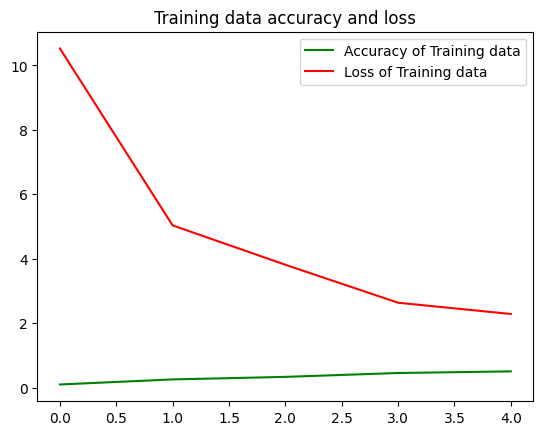

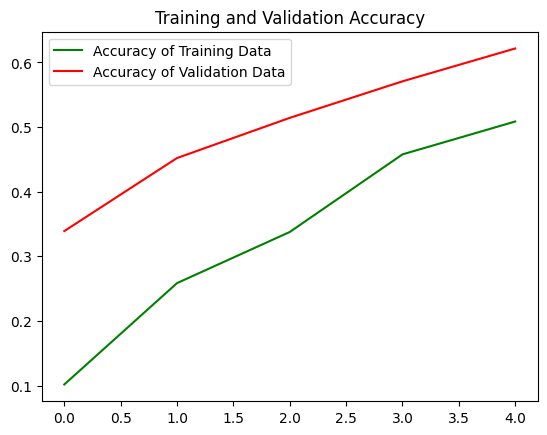

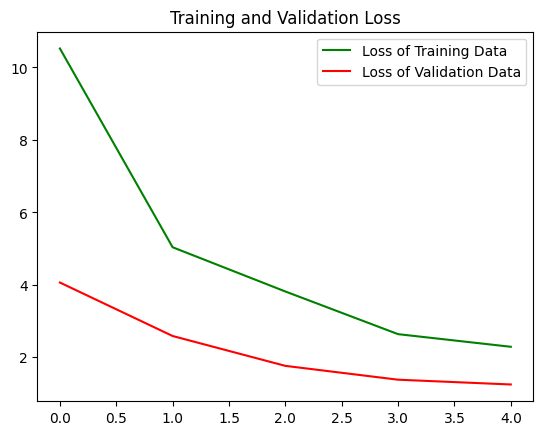

<Figure size 640x480 with 0 Axes>

In [ ]:
get_ac = history.history['accuracy']
get_los = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(len(get_ac))
plt.plot(epochs, get_ac, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_ac, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_los, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)
plt.figure()
plt.show()

1/1 [==============================] - 1s 679ms/step


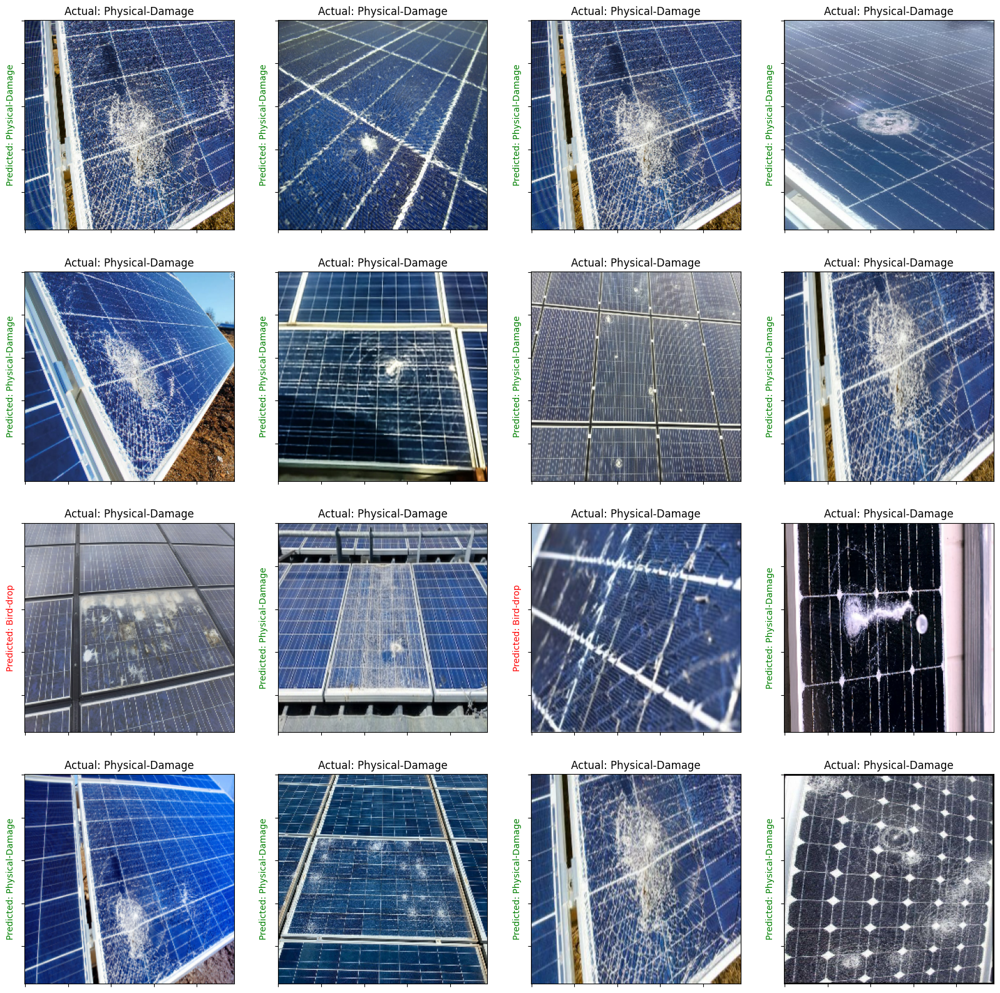

In [ ]:
loss, accuracy = model.evaluate(val_ds)

plt.figure(figsize=(20, 20))
for images, labels in val_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

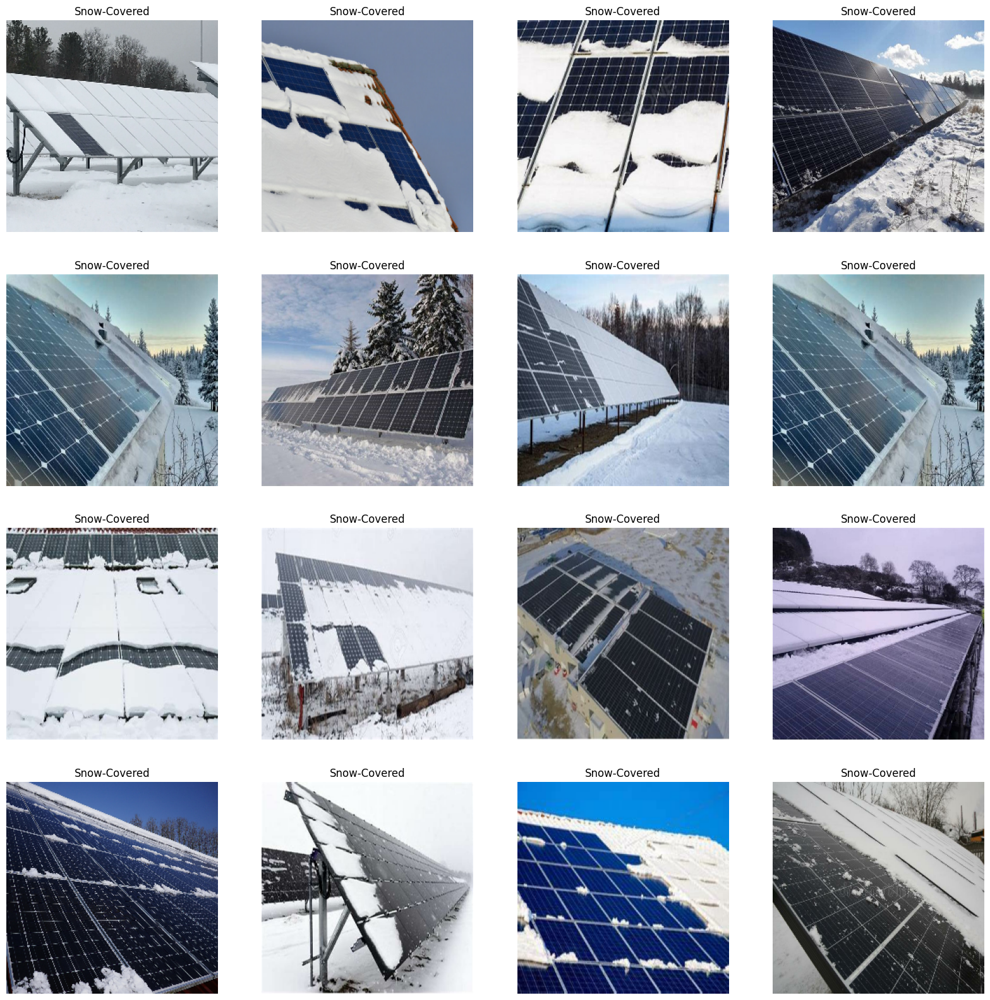

In [ ]:
# Function to display images by class
def display_images_by_class(dataset, class_name, class_names, num_images=16):
    """
    Display images of a specified class from the dataset.

    Parameters:
    dataset (tf.data.Dataset): The dataset from which to display images.
    class_name (str): The name of the class to display.
    class_names (list): List of class names.
    num_images (int): Number of images to display. Default is 16.
    """
    class_index = class_names.index(class_name)
    plt.figure(figsize=(20, 20))
    count = 0
    for images, labels in dataset:
        for i in range(len(labels)):
            if labels[i] == class_index:
                ax = plt.subplot(4, 4, count + 1)
                plt.imshow(images[i].numpy().astype("uint8"))
                plt.title(class_name)
                plt.axis("off")
                count += 1
                if count >= num_images:
                    plt.show()
                    return
    plt.show()

display_images_by_class(train_ds, 'Snow-Covered', class_names)

In [ ]:
import tensorflow as tf

# Recreate datasets with shuffling to ensure proper splitting
train_ds = tf.keras.utils.image_dataset_from_directory(
    'solar-panel-images/Faulty_solar_panel',
    validation_split=0.2,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=32,
    seed=42,
    shuffle=True)

val_ds = tf.keras.utils.image_dataset_from_directory(
    'solar-panel-images/Faulty_solar_panel',
    validation_split=0.2,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=32,
    seed=42,
    shuffle=True)  # Ensuring shuffle=True for validation as well

class_names = train_ds.class_names
print(f"Class Names: {class_names}")


Found 885 files belonging to 6 classes.
Using 708 files for training.
Found 885 files belonging to 6 classes.
Using 177 files for validation.
Class Names: ['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']


In [ ]:
def get_class_distribution(dataset, class_names):
    """
    Get the distribution of classes in the dataset.

    Parameters:
    dataset (tf.data.Dataset): The dataset to analyze.
    class_names (list): List of class names.

    Returns:
    dict: Dictionary with class names as keys and counts as values.
    """
    class_count = {class_name: 0 for class_name in class_names}
    for _, labels in dataset:
        for label in labels:
            class_count[class_names[label]] += 1
    return class_count

# Assuming you have the class names list
class_names = ['Clean', 'Dusty', 'Bird-Drop', 'Electrical-Damage', 'Physical-Damage', 'Snow-Covered']

train_class_distribution = get_class_distribution(train_ds, class_names)
val_class_distribution = get_class_distribution(val_ds, class_names)

print("Training Set Class Distribution:", train_class_distribution)
print("Validation Set Class Distribution:", val_class_distribution)

Training Set Class Distribution: {'Clean': 162, 'Dusty': 159, 'Bird-Drop': 147, 'Electrical-Damage': 87, 'Physical-Damage': 50, 'Snow-Covered': 103}
Validation Set Class Distribution: {'Clean': 45, 'Dusty': 34, 'Bird-Drop': 43, 'Electrical-Damage': 16, 'Physical-Damage': 19, 'Snow-Covered': 20}


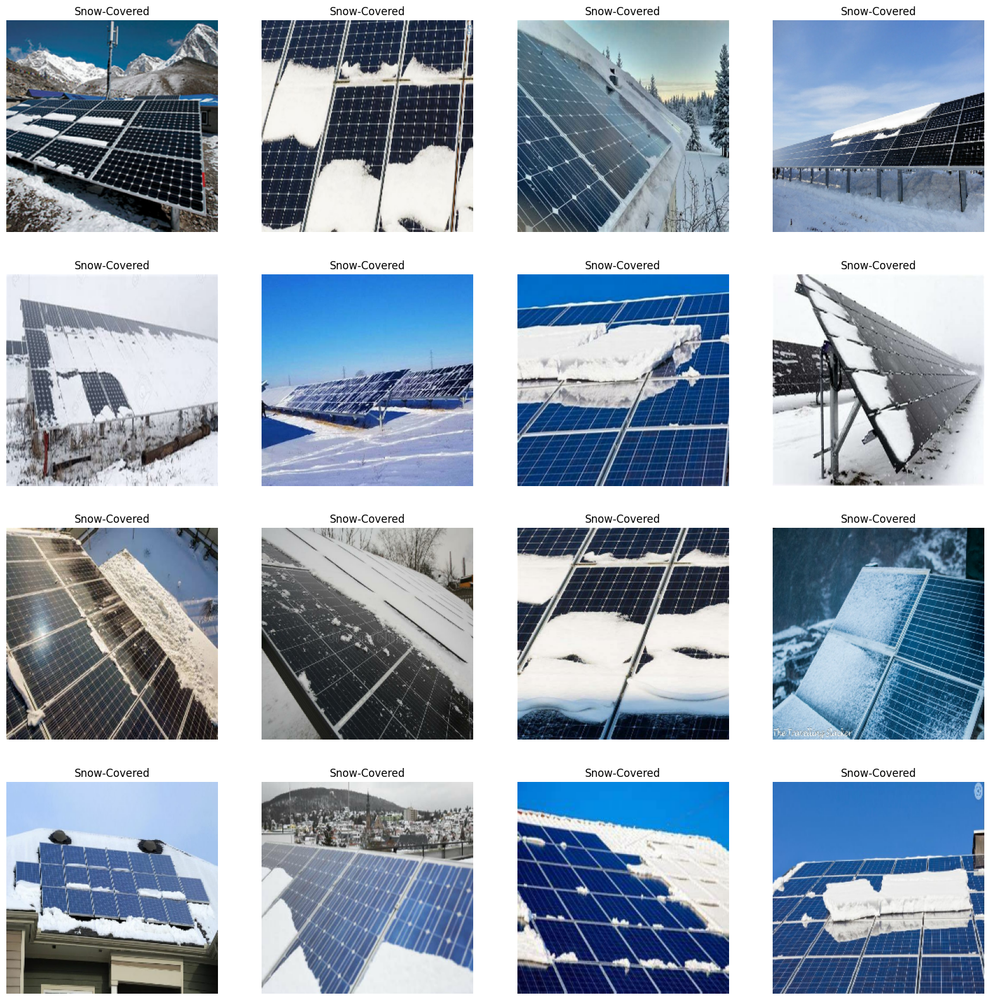

In [ ]:
# Function to display images by class
def display_images_by_class(dataset, class_name, class_names, num_images=16):
    """
    Display images of a specified class from the dataset.

    Parameters:
    dataset (tf.data.Dataset): The dataset from which to display images.
    class_name (str): The name of the class to display.
    class_names (list): List of class names.
    num_images (int): Number of images to display. Default is 16.
    """
    class_index = class_names.index(class_name)
    plt.figure(figsize=(20, 20))
    count = 0
    for images, labels in dataset:
        for i in range(len(labels)):
            if labels[i] == class_index:
                ax = plt.subplot(4, 4, count + 1)
                plt.imshow(images[i].numpy().astype("uint8"))
                plt.title(class_name)
                plt.axis("off")
                count += 1
                if count >= num_images:
                    plt.show()
                    return
    plt.show()

display_images_by_class(val_ds, 'Snow-Covered', class_names)

In [ ]:
from tensorflow.keras.models import load_model

# Save the model
model.save('model.h5')

# Download the model file
from google.colab import files
files.download('model.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>